# 03 — โซนปลูก + แผนที่เซ็นเซอร์และอุปกรณ์ (L1 → L2)

**เป้าหมาย**: วาง "สิ่งที่วัด" ลงบน "รูปทรงห้อง" — แบ่งชั้นปลูกเป็นโซน, กำหนดตำแหน่งเซ็นเซอร์ XY-MD02 ทั้ง 5 ตัว / กล่องควบคุม / อุปกรณ์อื่นในพิกัดห้อง แล้วบันทึกเป็นไฟล์ที่ notebook 04–05 ใช้ผูกข้อมูล IoT กับตำแหน่ง

ผลลัพธ์
- `data/model/zones.json` — โซน = ชั้น × ช่วงความยาว (5 × 3 = 15 โซน) + voxel grid ของอากาศในห้อง
- `data/sensors/equipment_map.csv` — กล่องอุปกรณ์ (แอร์, ถัง, ตู้ไฟ, พัดลม, ประตู…) ในพิกัดห้อง
- `data/sensors/sensor_map.csv` — ตำแหน่งเซ็นเซอร์/กล่อง IoT + โซนที่สังกัด

ที่มาของตำแหน่ง (รวมอยู่ใน `pfal_twin/layout.py`)
1. การวิเคราะห์ point cloud + dashboard + พฤติกรรมข้อมูล (แผน §1.6) — เขียนในพิกัดสแกน แปลงด้วย `transform_scan_to_room`
2. **ภาพถ่ายหน้างาน 13 ก.ย. 2026** 2 ชุด (IMG_2518–2533 และ IMG_2534–2552 ใน `data/raw/picture/`, สรุปใน `docs/SITE_SURVEY_2026-09-13.md`) — ยืนยัน/แก้ไข/เพิ่มรายการ คอลัมน์ `verified=True` เมื่อภาพเห็นชัด, `confidence=medium` เมื่อกะตำแหน่งจากภาพ (±0.3 ม.)

โครงสร้างระบบที่ได้จากป้ายกล่องควบคุม (ภาพชุด 2)
- **ชั้นล่าง (tier 1)** = ระบบอนุบาล: **อนุบาล 1 = ฝั่งประตู (T1-N1)**, **อนุบาล 2 = ฝั่งถังสารอาหารชั้นปลูก (T1-N2)** แต่ละฝั่งมีถัง 100 L ใต้ชั้นของตัวเอง, กล่องพัดลม "ชั้นล่าง"; **อนุบาล 2 คุมด้วย gc2** (ชุดปุ๋ยข้าง rack), อนุบาล 1 ไม่มีตัวควบคุม
- **4 ชั้นบน (tier 2–5) = ผัก Growing stage** ระบบร่วม ถัง 200 L: กล่องพัดลม "4 ชั้น" (FAN1–4), **Grow Controller gc1** ที่ปลาย rack (ยืนยัน 14 ก.ย. — ป้ายบน dashboard "ชั้นปลูกที่ 1/2-5" ไม่ตรงกับความจริง)
- **ชั้นเพาะเมล็ด** (ป้ายกล่องพัดลม "อนุบาลพืช") = ชั้นวาง 3 ชั้นมุมห้อง (หลอด T5) มีกล่องพัดลมของตัวเอง — ตรงกับ "ชั้นเพาะเมล็ด" ในแปลนหน้า 7

> ⚠️ **XY-MD02 ติดผนัง** — พบตัวเครื่อง 4 ตัว (ข้างจอ CO₂ W1, ใต้แอร์ 1 W2, ถัดจากแอร์ 1 ไปทางปลายห้อง W3, นอกห้อง W6) ขณะที่ gateway รายงาน 5 address (`xy_md_20–24`) → ตัวที่ 5 **อยู่ห้องหน้า เหนือประตู** (W4, ภาพ 2587 — ยืนยันแล้ว) ครบ 5 ตัว; ยังไม่รู้ว่า address ไหนคือตัวไหน; `thingsboard.TIER_SENSOR` คงสมมติฐาน "1 ช่อง/ชั้น" ไว้ให้ notebook 04–05 รันได้เท่านั้น

In [1]:
import sys, warnings
from pathlib import Path
warnings.filterwarnings("ignore")
ROOT = Path.cwd().parent if Path.cwd().name == "notebooks" else Path.cwd()
sys.path.insert(0, str(ROOT))

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly.io as pio
from pfal_twin import io, geometry as G, viz, layout, thingsboard as tb, hydraulics as H, schematic as S
pio.renderers.default = "vscode+notebook"   # works in VS Code and JupyterLab
FIG = ROOT / "figures"; FIG.mkdir(exist_ok=True)
print("project root:", ROOT)

project root: /Users/gasza/Documents/Job/SIS KU/Task/Rong_Pralong/PFAL


## 1. โหลดโมเดลห้อง + point cloud ที่จัดแนวแล้ว

In [2]:
model = io.load_model()
pc = io.load_clean(); P, RGB, LAB = pc["xyz"], pc["rgb"], pc["labels"]
R, K = model["room"], model["rack"]
print(f"room {R['L']} x {R['W']} x {R['H']} m | rack {K['length']} x {K['width']} m, {len(K['tiers'])} tiers | {len(P):,} points")

room 7.12 x 3.01 x 2.58 m | rack 5.43 x 1.04 m, 5 tiers | 1,014,282 points


## 2. โซนปลูก: ชั้น × ช่วงความยาว
ชั้น 2–5 (**Growing stage**, `stage="growing stage"` ใน zones.json) แบ่งเป็น 3 ช่วงตามความยาว rack (S1 = ด้านประตู X≈0, S3 = ปลายห้อง); **ชั้น 1 แบ่งตามรอยต่อถาดจริงที่ X ≈ 2.22 ม.: T1-N1 อนุบาล 1 (ประตู, ~1.4 ม., ถาด 3 ร่องมีน้ำขัง) / T1-N2 อนุบาล 2 (ปลายห้อง, ~3.9 ม., ถาดเทา)** — สัดส่วนตรงกับแปลนหน้า 7; แต่ละฝั่งมีถัง 100 L ของตัวเอง (ดูรูปตัดในข้อ 2b) แต่ละโซนคือกล่องเหนือแผ่นชั้นสูง 0.35 ม. (ระยะ canopy)

In [3]:
NURSERY_SPLIT_X = 2.22     # boundary nursery 1 | nursery 2 on tier 1, measured in the point cloud (tray gap at X 2.15-2.30)
zones = G.make_zones(model, n_segments=3, canopy_height=0.35, segments_per_tier={1: 2}, splits={1: [NURSERY_SPLIT_X]})
grid = G.air_grid(model, dx=0.5)
io.save_model(dict(zones=zones, air_grid=grid, n_segments=3, segments_per_tier={"1": 2}, splits={"1": [NURSERY_SPLIT_X]}, canopy_height=0.35), name="zones.json")
print(f"{len(zones)} zones, air grid {grid['nx']} x {grid['ny']} x {grid['nz']} = {grid['n_cells']} cells of {grid['dx']} m")
pd.DataFrame(zones).head(6)

14 zones, air grid 15 x 7 x 6 = 630 cells of 0.5 m


,zone,tier,stage,segment,n_segments,x0,x1,y0,y1,z0,z1
0,T1-N1,1,nursery 1,1,2,0.771,2.220,0.985,2.025,0.387,0.737
1,T1-N2,1,nursery 2,2,2,2.220,6.202,0.985,2.025,0.387,0.737
2,T2-S1,2,growing stage,1,3,0.771,2.581,0.985,2.025,0.807,1.157
3,T2-S2,2,growing stage,2,3,2.581,4.392,0.985,2.025,0.807,1.157
4,T2-S3,2,growing stage,3,3,4.392,6.202,0.985,2.025,0.807,1.157
5,T3-S1,3,growing stage,1,3,0.771,2.581,0.985,2.025,1.267,1.617


### 2b. หลักฐานจุดแบ่งอนุบาล 1 / 2 — รูปตัดชั้น 1 ตามความยาวจาก point cloud

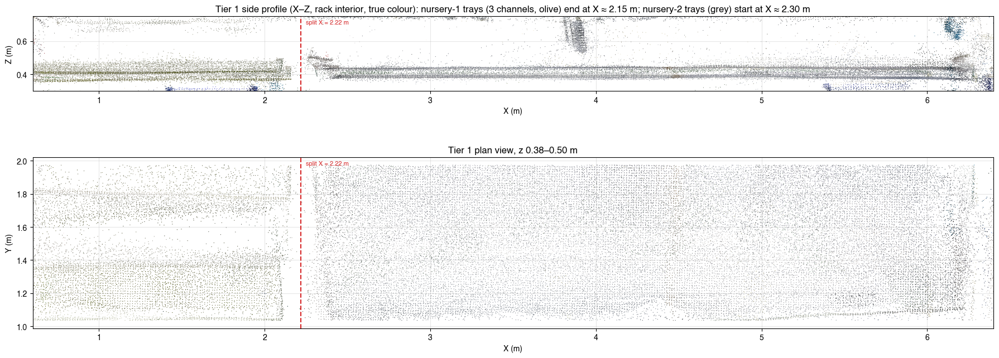

In [4]:
sel = (P[:, 1] > K["y0"] + 0.05) & (P[:, 1] < K["y1"] - 0.05) & (P[:, 2] > 0.30) & (P[:, 2] < 0.75)
fig, axes = plt.subplots(2, 1, figsize=(18, 7.5))
axes[0].scatter(P[sel, 0], P[sel, 2], s=0.6, c=RGB[sel] / 255.0, linewidths=0); axes[0].set_ylim(0.3, 0.75); axes[0].set_ylabel("Z (m)")
axes[0].set_title("Tier 1 side profile (X–Z, rack interior, true colour): nursery-1 trays (3 channels, olive) end at X ≈ 2.15 m; nursery-2 trays (grey) start at X ≈ 2.30 m")
sl = sel & (P[:, 2] > 0.38) & (P[:, 2] < 0.50)
axes[1].scatter(P[sl, 0], P[sl, 1], s=0.8, c=RGB[sl] / 255.0, linewidths=0); axes[1].set_ylabel("Y (m)"); axes[1].set_title("Tier 1 plan view, z 0.38–0.50 m")
for ax in axes:
    ax.axvline(NURSERY_SPLIT_X, color="#d62728", ls="--", lw=1.5); ax.text(NURSERY_SPLIT_X + 0.03, ax.get_ylim()[1] - 0.02, f"split X = {NURSERY_SPLIT_X} m", color="#d62728", va="top", fontsize=8)
    ax.set_xlim(0.6, 6.4); ax.set_aspect("equal"); ax.grid(alpha=.3); ax.set_xlabel("X (m)")
fig.tight_layout(); fig.savefig(FIG / "03_tier1_nursery_split.png", dpi=150)

## 3. อุปกรณ์ในห้อง — scan + ภาพถ่าย → พิกัดห้อง
รายการใน `layout.EQUIPMENT` ระบุ `frame="scan"` (จากการวิเคราะห์ point cloud, แปลงด้วย `transform_scan_to_room`) หรือ `frame="room"` (กะจากภาพถ่าย) — ย้ายจุดใน PLY หรือแก้ตัวเลขแล้วรันใหม่ได้ทันที

In [5]:
eq = layout.equipment_room(model)
print(f"{len(eq)} items, {eq.verified.sum()} verified by photos")
eq[["name", "category", "frame", "x0", "x1", "y0", "y1", "z0", "z1", "confidence", "verified"]]

29 items, 28 verified by photos


,name,category,frame,x0,x1,y0,y1,z0,z1,confidence,verified
0,AC indoor unit 1,hvac,scan,3.437,4.342,2.753,3.010,1.991,2.293,high,True
1,AC indoor unit 2,hvac,scan,1.937,2.842,2.778,3.010,1.987,2.289,high,True
2,"Windows (2 panes, face the cafe)",structure,scan,2.592,4.899,0.000,0.282,1.089,2.196,high,True
3,"Door (aluminium, glass top)",structure,scan,0.000,0.108,0.072,0.675,0.000,1.982,high,True
4,"Exhaust fan (Hatari 200 mm, 23 W)",hvac,scan,0.032,0.136,2.423,2.674,1.881,2.132,high,True
5,"Seed germination shelf (3 tiers, T5 tubes, own...",furniture,scan,5.597,6.912,0.059,0.881,0.000,0.851,high,True
6,CO2 & environment controller (display + sensor...,electrical,scan,0.438,1.345,2.752,3.010,0.983,1.735,high,True
7,TP-Link WiFi router (4 antennas),electrical,room,1.850,2.050,0.000,0.080,1.300,1.700,medium,True
8,Grow Controller gc1 - rack END = GROWING stage...,electrical,room,6.180,6.260,1.200,1.550,1.150,1.450,high,True
9,Grow Controller gc2 - rack SIDE = NURSERY-2 do...,electrical,room,5.650,5.950,2.020,2.100,1.100,1.450,high,True


### ตรวจกล่องระดับพื้นกับ point cloud — ชั้นตัดขวาง z 0.04–0.36 ม. (ใต้แผ่นชั้น 1) ซ้อนกรอบอุปกรณ์ที่ z0 < 0.36

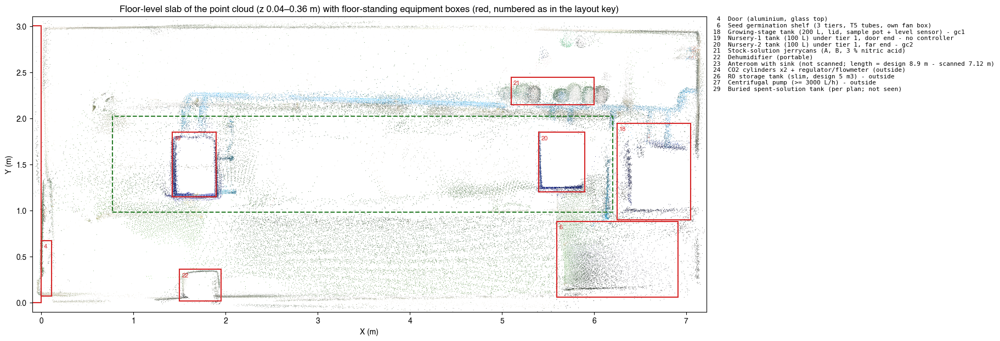

In [6]:
sl = (P[:, 2] > 0.04) & (P[:, 2] < 0.36)
idx = np.where(sl)[0]; idx = idx[:: max(1, len(idx) // 250000)]
fig, ax = plt.subplots(figsize=(19, 7))
ax.scatter(P[idx, 0], P[idx, 1], s=0.4, c=RGB[idx] / 255.0, linewidths=0)
ax.add_patch(plt.Rectangle((K["x0"], K["y0"]), K["length"], K["width"], fill=False, ec="#2a7d2a", lw=1.5, ls="--"))
eq_key, _ = viz.layout_key(eq)                      # same numbers as the layout figure
low = eq[eq.z0 < 0.36]
for _, r in low.iterrows():
    ax.add_patch(plt.Rectangle((r.x0, r.y0), r.x1 - r.x0, r.y1 - r.y0, fill=False, ec="#d62728", lw=1.5))
    ax.annotate(eq_key[r["name"]], (r.x0, r.y1), xytext=(3, -10), textcoords="offset points", fontsize=8, fontweight="bold", color="#d62728")
ax.text(1.01, 1, "\n".join(f"{eq_key[n]:>2}  {n}" for n in low["name"]), transform=ax.transAxes, va="top", fontsize=8, family="monospace")
ax.set_aspect("equal"); ax.set_xlim(-0.1, R["L"] + 0.1); ax.set_ylim(-0.1, R["W"] + 0.1)
ax.set_xlabel("X (m)"); ax.set_ylabel("Y (m)"); ax.set_title("Floor-level slab of the point cloud (z 0.04–0.36 m) with floor-standing equipment boxes (red, numbered as in the layout key)")
fig.savefig(FIG / "03_floor_slab_check.png", dpi=150, bbox_inches="tight")

ถังอนุบาลทั้งสองใบ (100 L) เห็นชัดใน point cloud (อนุบาล 1 ที่ X≈1.4–1.9 ฝั่งประตู, อนุบาล 2 ที่ X≈5.4–5.9 ฝั่งถังชั้นปลูก; ~0.5 × 0.7 × 0.33 ม.) — ขนาดใน `layout.py` อ้างอิงจากภาพนี้

## 3b. ภาพถ่ายหน้างาน (13 ก.ย. 2026) — contact sheet 2 ชุด สำหรับอ้างอิงในบทความ / ตรวจสอบตำแหน่ง

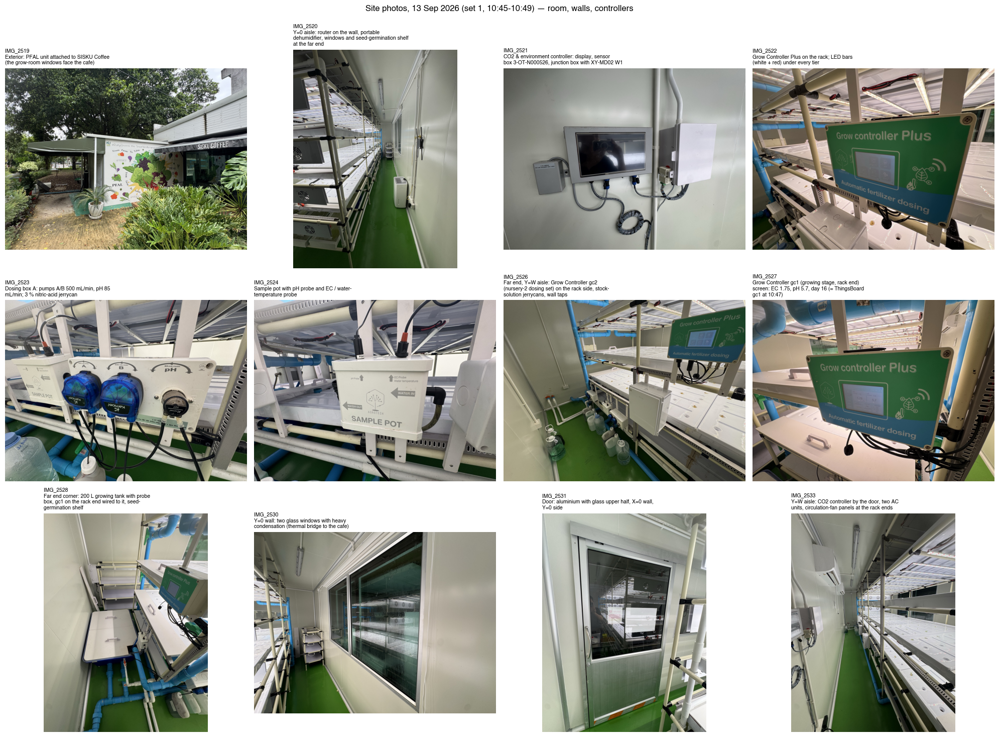

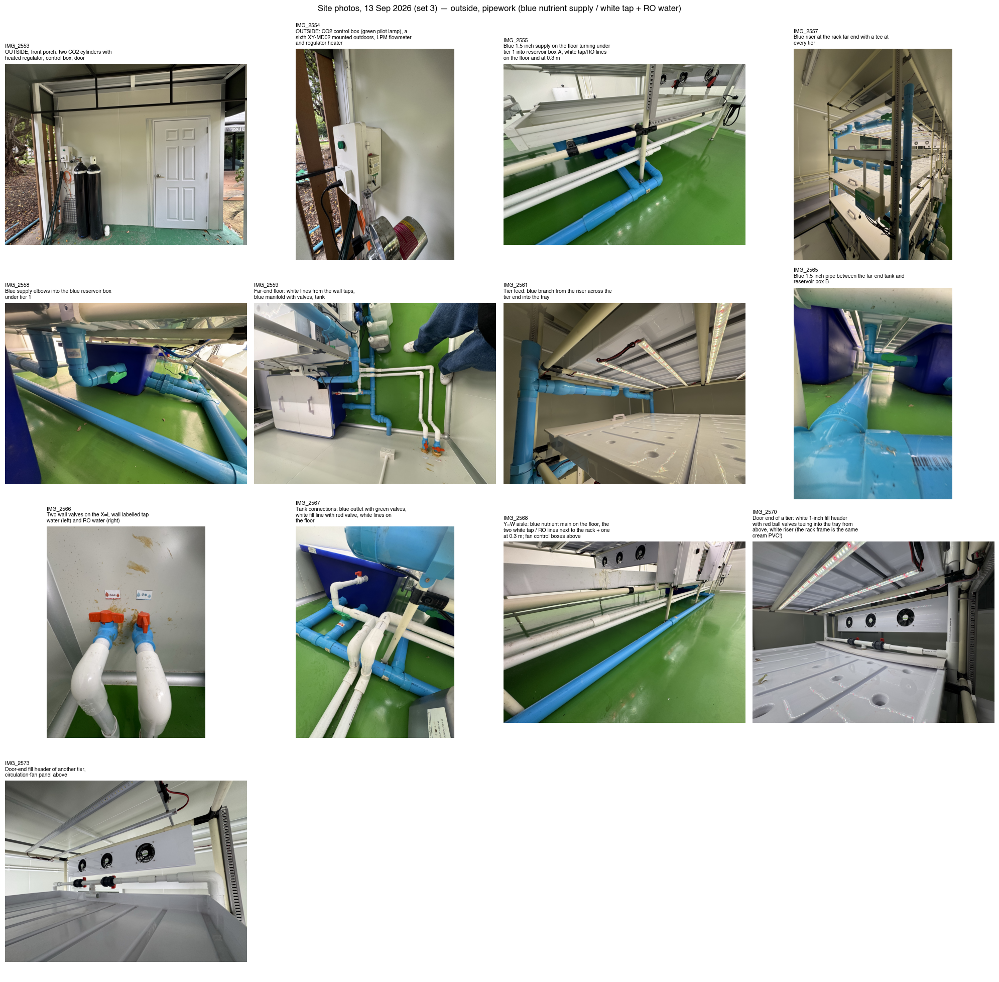

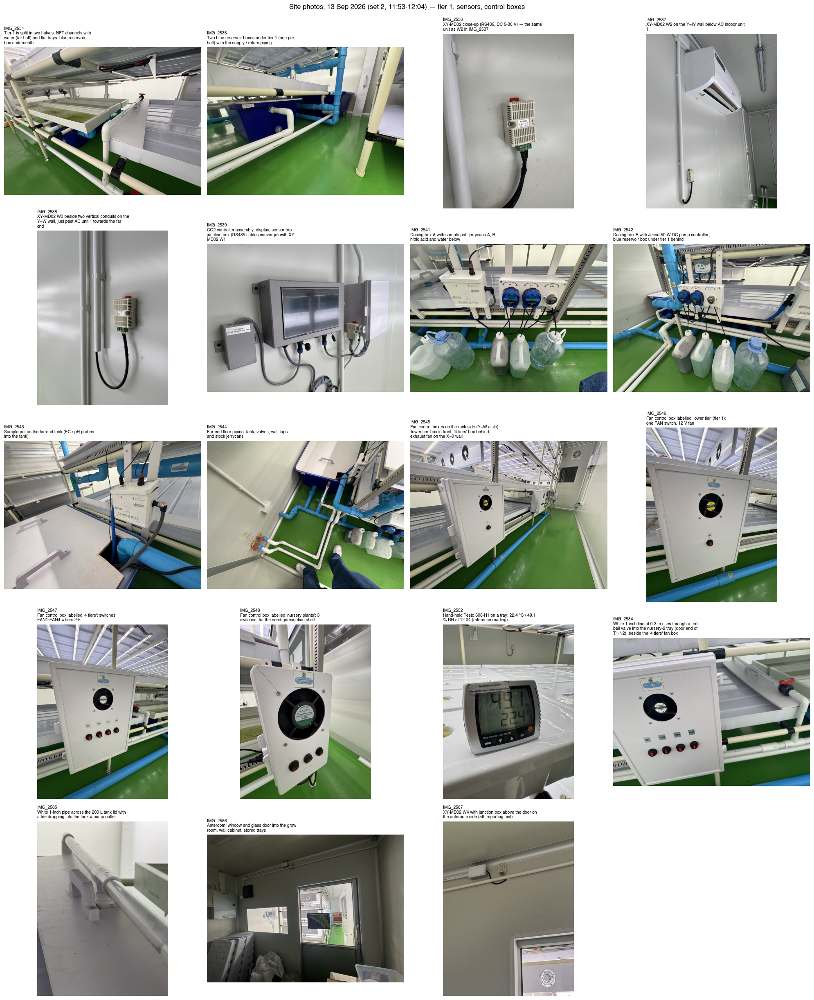

In [7]:
import textwrap
from PIL import Image, ImageOps          # EXIF orientation of phone photos
PHOTOS = io.RAW / "picture" / "jpg"          # สร้างด้วย  sh scripts/photos_to_jpg.sh
SHEETS = {
 "03_site_photos_1.png": ("Site photos, 13 Sep 2026 (set 1, 10:45-10:49) — room, walls, controllers", {
    "IMG_2519": "Exterior: PFAL unit attached to SISKU Coffee (the grow-room windows face the cafe)",
    "IMG_2520": "Y=0 aisle: router on the wall, portable dehumidifier, windows and seed-germination shelf at the far end",
    "IMG_2521": "CO2 & environment controller: display, sensor box 3-OT-N000526, junction box with XY-MD02 W1",
    "IMG_2522": "Grow Controller Plus on the rack; LED bars (white + red) under every tier",
    "IMG_2523": "Dosing box A: pumps A/B 500 mL/min, pH 85 mL/min; 3 % nitric-acid jerrycan",
    "IMG_2524": "Sample pot with pH probe and EC / water-temperature probe",
    "IMG_2526": "Far end, Y=W aisle: Grow Controller gc2 (nursery-2 dosing set) on the rack side, stock-solution jerrycans, wall taps",
    "IMG_2527": "Grow Controller gc1 (growing stage, rack end) screen: EC 1.75, pH 5.7, day 16 (= ThingsBoard gc1 at 10:47)",
    "IMG_2528": "Far end corner: 200 L growing tank with probe box, gc1 on the rack end wired to it, seed-germination shelf",
    "IMG_2530": "Y=0 wall: two glass windows with heavy condensation (thermal bridge to the cafe)",
    "IMG_2531": "Door: aluminium with glass upper half, X=0 wall, Y=0 side",
    "IMG_2533": "Y=W aisle: CO2 controller by the door, two AC units, circulation-fan panels at the rack ends"}),
 "03_site_photos_3.png": ("Site photos, 13 Sep 2026 (set 3) — outside, pipework (blue nutrient supply / white tap + RO water)", {
    "IMG_2553": "OUTSIDE, front porch: two CO2 cylinders with heated regulator, control box, door",
    "IMG_2554": "OUTSIDE: CO2 control box (green pilot lamp), a sixth XY-MD02 mounted outdoors, LPM flowmeter and regulator heater",
    "IMG_2555": "Blue 1.5-inch supply on the floor turning under tier 1 into reservoir box A; white tap/RO lines on the floor and at 0.3 m",
    "IMG_2557": "Blue riser at the rack far end with a tee at every tier",
    "IMG_2558": "Blue supply elbows into the blue reservoir box under tier 1",
    "IMG_2559": "Far-end floor: white lines from the wall taps, blue manifold with valves, tank",
    "IMG_2561": "Tier feed: blue branch from the riser across the tier end into the tray",
    "IMG_2565": "Blue 1.5-inch pipe between the far-end tank and reservoir box B",
    "IMG_2566": "Two wall valves on the X=L wall labelled tap water (left) and RO water (right)",
    "IMG_2567": "Tank connections: blue outlet with green valves, white fill line with red valve, white lines on the floor",
    "IMG_2568": "Y=W aisle: blue nutrient main on the floor, the two white tap / RO lines next to the rack + one at 0.3 m; fan control boxes above",
    "IMG_2570": "Door end of a tier: white 1-inch fill header with red ball valves teeing into the tray from above, white riser (the rack frame is the same cream PVC!)",
    "IMG_2573": "Door-end fill header of another tier, circulation-fan panel above"}),
 "03_site_photos_2.png": ("Site photos, 13 Sep 2026 (set 2, 11:53-12:04) — tier 1, sensors, control boxes", {
    "IMG_2534": "Tier 1 is split in two halves: NFT channels with water (far half) and flat trays; blue reservoir box underneath",
    "IMG_2535": "Two blue reservoir boxes under tier 1 (one per half) with the supply / return piping",
    "IMG_2536": "XY-MD02 close-up (RS485, DC 5-30 V) — the same unit as W2 in IMG_2537",
    "IMG_2537": "XY-MD02 W2 on the Y=W wall below AC indoor unit 1",
    "IMG_2538": "XY-MD02 W3 beside two vertical conduits on the Y=W wall, just past AC unit 1 towards the far end",
    "IMG_2539": "CO2 controller assembly: display, sensor box, junction box (RS485 cables converge) with XY-MD02 W1",
    "IMG_2541": "Dosing box A with sample pot; jerrycans A, B, nitric acid and water below",
    "IMG_2542": "Dosing box B with Jecod 50 W DC pump controller; blue reservoir box under tier 1 behind",
    "IMG_2543": "Sample pot on the far-end tank (EC / pH probes into the tank)",
    "IMG_2544": "Far-end floor piping: tank, valves, wall taps and stock jerrycans",
    "IMG_2545": "Fan control boxes on the rack side (Y=W aisle) — 'lower tier' box in front, '4 tiers' box behind; exhaust fan on the X=0 wall",
    "IMG_2546": "Fan control box labelled 'lower tier' (tier 1): one FAN switch, 12 V fan",
    "IMG_2547": "Fan control box labelled '4 tiers': switches FAN1-FAN4 = tiers 2-5",
    "IMG_2548": "Fan control box labelled 'nursery plants': 3 switches, for the seed-germination shelf",
    "IMG_2552": "Hand-held Testo 608-H1 on a tray: 22.4 °C / 49.1 % RH at 12:04 (reference reading)",
    "IMG_2584": "White 1-inch line at 0.3 m rises through a red ball valve into the nursery-2 tray (door end of T1-N2), beside the '4 tiers' fan box",
    "IMG_2585": "White 1-inch pipe across the 200 L tank lid with a tee dropping into the tank = pump outlet",
    "IMG_2586": "Anteroom: window and glass door into the grow room, wall cabinet, stored trays",
    "IMG_2587": "XY-MD02 W4 with junction box above the door on the anteroom side (5th reporting unit)"}),
}
for fname, (title, captions) in SHEETS.items():
    n = len(captions); ncol = 4; nrow = int(np.ceil(n / ncol))
    fig, axes = plt.subplots(nrow, ncol, figsize=(20, 4.9 * nrow))
    for ax, (name, cap) in zip(axes.flat, captions.items()):
        f = PHOTOS / f"{name}.jpg"
        if f.exists(): ax.imshow(ImageOps.exif_transpose(Image.open(f)))
        ax.set_title(f"{name}\n" + "\n".join(textwrap.wrap(cap, 48)), fontsize=7.5, loc="left"); ax.axis("off")
    for ax in axes.flat[n:]: ax.axis("off")
    fig.suptitle(title, y=0.995, fontsize=12)
    fig.tight_layout(); fig.savefig(FIG / fname, dpi=100)

## 4. ตำแหน่งเซ็นเซอร์
- **ยืนยันจากภาพ**: CO₂ controller (ผนัง Y=W ใกล้ประตู), gateway (ผนัง Y=0, X≈2), gc1 (ปลาย rack สายเข้าถัง 200 L = growing — ตรวจด้วยค่าบนจอเทียบ ThingsBoard), gc2 (ข้าง rack เหนือ dosing box = อนุบาล 2), เซ็นเซอร์ระดับน้ำที่ถังพัก, XY-MD02 1 ตัวบนผนังข้างจอ CO₂ (ยังไม่รู้ address)
- **ช่องข้อมูล `xy_md_20…24` (5 ช่อง) ยังไม่ผูกกับตัวเครื่อง** — ภาพพบ XY-MD02 จริง **4 ตัว** (W1 ข้างจอ CO₂, W2 ใต้แอร์ 1, W3 ถัดจากแอร์ 1 ไปทางปลายห้อง, W6 นอกห้อง) แต่ gateway รายงาน 5 address → มีอย่างน้อย 1 ตัวที่ยังไม่ได้ถ่ายภาพ; **ไม่วาดช่องข้อมูลเป็นจุดแยก**ในผังอีก; `thingsboard.TIER_SENSOR` (20→ชั้น 1 … 24→ชั้น 5) คงไว้เป็นสมมติฐานให้ notebook 04–05 รันได้ และ `xy_md_24` (แกว่งวันละ 7 °C พีค 13:00) น่าจะเป็นตัวนอกห้อง W6

In [8]:
sensors = layout.sensor_map(model, zones, eq)
p1, p2 = layout.save_layout(sensors, eq)
pd.DataFrame(layout.REFERENCE_READINGS).to_csv(io.SENSOR_DIR / "reference_readings.csv", index=False)   # hand-held Testo readings
print("saved", p1.name, ",", p2.name, "and reference_readings.csv in", p1.parent)
sensors[["sensor", "device", "tier", "x", "y", "z", "zone", "placed_on", "confidence", "verified", "evidence"]]

saved sensor_map.csv , equipment_map.csv and reference_readings.csv in /Users/gasza/Documents/Job/SIS KU/Task/Rong_Pralong/PFAL/data/sensors


,sensor,device,tier,x,y,z,zone,placed_on,confidence,verified,evidence
0,XY-MD02 W1 (by CO2 display),gw,NaN,1.250,2.980,1.350,None,photo estimate,high,True,IMG_2521/2539: on the junction box beside the ...
1,XY-MD02 W2 (under AC 1),gw,NaN,3.600,2.980,1.300,None,photo estimate,high,True,"IMG_2537 (+ close-up IMG_2536, same unit by th..."
2,"XY-MD02 W3 (by conduit, above the nursery-2 tank)",gw,NaN,5.650,2.980,1.400,None,photo estimate,medium,True,IMG_2538 + site note 2026-09-14: on the same Y...
3,"XY-MD02 W4 (ANTEROOM, above the door)",gw,NaN,-0.060,0.850,2.200,None,photo estimate,high,True,IMG_2587: XY-MD02 with a small junction box on...
4,co2,co2,NaN,0.892,2.881,1.359,None,CO2 & environment controller (display + sensor...,high,True,IMG_2521/2540: sensor box labelled 'CO2 and en...
5,gw,gw,NaN,0.892,2.881,1.359,None,CO2 & environment controller (display + sensor...,medium,True,IMG_2539: the RS485 cables of the XY-MD02 unit...
6,gc1,gc1,NaN,6.220,1.375,1.300,None,Grow Controller gc1 - rack END = GROWING stage...,high,True,IMG_2527/2528; growing-stage loop confirmed 20...
7,gc2,gc2,NaN,5.800,2.060,1.275,None,Grow Controller gc2 - rack SIDE = NURSERY-2 do...,high,True,IMG_2526; nursery-2 loop confirmed 2026-09-14
8,waterLevel_1,gw,NaN,6.350,1.900,0.620,None,photo estimate,medium,True,IMG_2528/2544: small white float/level box on ...
9,"XY-MD02 W6 (OUTSIDE, on CO2 box)",gw,NaN,-1.980,2.800,1.250,None,photo estimate,high,True,IMG_2554: XY-MD02 mounted outdoors on the CO2 ...


## 5. ผัง 2 มิติ (plan + side elevation) — อุปกรณ์เป็นหมายเลข, เซ็นเซอร์เป็นตัวอักษร, ท่อตามสีชนิด (ฟ้า = ท่อจ่ายขาวจากปั๊มถัง 200 L, ฟ้าอ่อน = ท่อยืน/หัวจ่ายพร้อมวาล์ว, เขียว = ในถาด, น้ำเงิน = น้ำกลับ, ม่วงเทา dash-dot = ท่อรวม drain/ล้นบนพื้น, จุด = ระบายทิ้ง, ส้ม/ฟ้าซีด = ประปา/RO, เส้นประ = สายปั๊มอนุบาลที่ยังไม่เห็น), คำอธิบายอยู่ด้านขวา

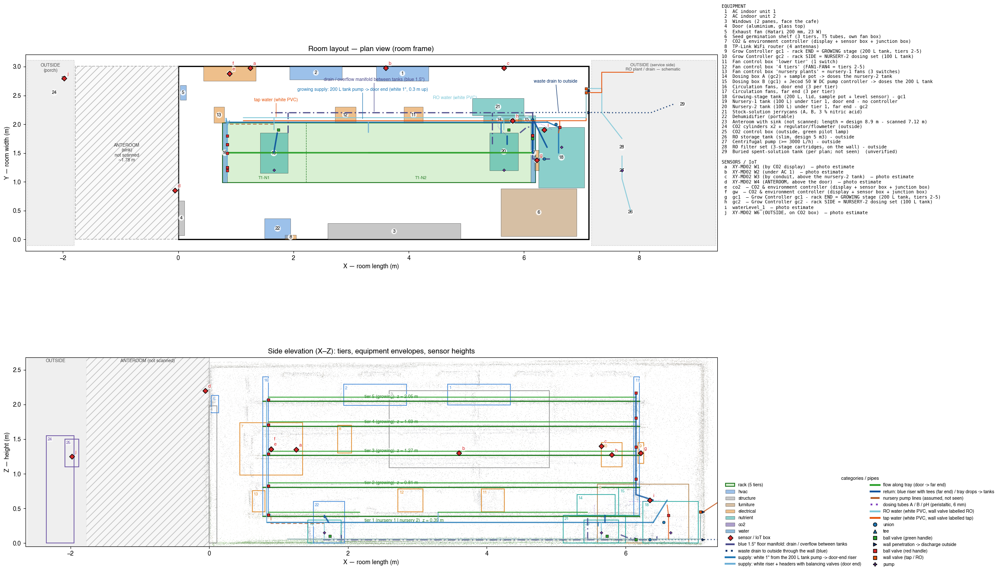

In [9]:
net = H.build_network(model, zones)          # pipework (detail + flow animation in notebook 03b)
fig = plt.figure(figsize=(27, 17))
gs = fig.add_gridspec(2, 2, width_ratios=[3.3, 1], height_ratios=[1.25, 1], wspace=0.01, hspace=0.12)
ax_plan, ax_key, ax_elev = fig.add_subplot(gs[0, 0]), fig.add_subplot(gs[:, 1]), fig.add_subplot(gs[1, 0])
viz.plan_layout(model, zones, eq, sensors, ax=ax_plan, key_ax=ax_key, net=net)
# elevation: room + anteroom + porch only (the outside RO plant is schematic and clutters the section)
viz.elevation_layout(model, P, RGB, eq[eq.location != "outside_far"], sensors[sensors.location != "outside_far"], ax=ax_elev, net=net)
fig.savefig(FIG / "03_layout_plan.png", dpi=170, bbox_inches="tight")

## 6. ภาพ 3 มิติ: โมเดล + โซน + อุปกรณ์ + เซ็นเซอร์ + ท่อ ซ้อน point cloud (hover ดูหลักฐาน/ความมั่นใจ; คลิก legend เพื่อซ่อน/แสดงแต่ละชั้นข้อมูล)

In [10]:
traces = ([viz.points_trace(P, RGB, n=60000, size=1.2, name="point cloud", opacity=0.5)]
          + viz.model_traces(model) + viz.zone_traces(zones, opacity=0.15)
          + viz.equipment_traces(eq) + H.pipe_traces(net) + H.fitting_traces(net) + [viz.sensor_trace(sensors, text=sensors["evidence"])])
fig3d = viz.figure_3d(traces, title="Zones, equipment, sensors and pipework in the room frame")
viz.show3d(fig3d, "03_zones_equipment_sensors")

full-window version: /Users/gasza/Documents/Job/SIS KU/Task/Rong_Pralong/PFAL/figures/html/03_zones_equipment_sensors.html   (open in a browser)


PosixPath('/Users/gasza/Documents/Job/SIS KU/Task/Rong_Pralong/PFAL/figures/html/03_zones_equipment_sensors.html')

## สถานะการยืนยัน (หลังดูภาพ 2 ชุด 13 ก.ย. 2026 — รายละเอียดใน `docs/SITE_SURVEY_2026-09-13.md`)
| รายการ | สถานะ |
|---|---|
| แอร์ 2 ตัว, ประตู, ชั้นเพาะเมล็ดมุมห้อง, ถังปลายห้อง, พัดลมระบายอากาศ | ✅ ตรงกับ scan |
| "แผงมืด" บนผนัง Y=0 | ✅ = **หน้าต่างกระจก 2 บาน** หันเข้าร้านกาแฟ มีไอน้ำเกาะ (thermal bridge) |
| "ตู้ควบคุม" ใกล้ประตู | ✅ = **CO₂ & environment controller** + กล่องต่อสาย RS485 (น่าจะเป็นที่อยู่ของ gateway) + XY-MD02 W1 |
| ชั้น 1 | ✅ อนุบาล 1 (ฝั่งประตู, T1-N1, X 0.77–2.22) / อนุบาล 2 (ฝั่งถังชั้นปลูก, T1-N2, X 2.22–6.20) จุดแบ่งวัดจาก point cloud; แต่ละฝั่งมีถัง 100 L ใต้ชั้น; ระบบแยกจากชั้น 2–5 (กล่องพัดลม "ชั้นล่าง"; อนุบาล 2 = gc2, อนุบาล 1 ไม่มีตัวควบคุม) |
| ชั้น 2–5 | ✅ **ผัก Growing stage** ระบบร่วม ถัง 200 L (กล่องพัดลม "4 ชั้น" FAN1–4, **gc1**) |
| ถังสต็อกปุ๋ย | ✏️ แกลลอน 5–10 ลิตรบนพื้นปลายห้อง; dosing box 2 ชุด + sample pot 3 จุด |
| Grow Controller | ✅ **gc1 ปลาย rack = ถัง 200 L growing** (ยืนยันด้วยค่าบนจอ + สาย + คำยืนยัน 14 ก.ย.), **gc2 ข้าง rack = ชุดปุ๋ยอนุบาล 2** |
| กล่องเสาอากาศ | ✏️ เป็น **TP-Link WiFi router** ไม่ใช่ gateway |
| XY-MD02 | ✅ ครบ 5 ตัว = 5 address: W1 ข้างจอ CO₂, W2 ใต้แอร์ 1, W3 ถัดจากแอร์ 1 ไปทางปลายห้อง (X≈5.65), **W4 ห้องหน้าเหนือประตู (2587)**, W6 นอกห้อง; address ↔ ตัวเครื่องยังไม่รู้; เดา `xy_md_24` = W6 (นอกห้อง), `xy_md_20` = W4 (ห้องหน้า), 21–23 = W1–W3 (ในห้อง) |
| ห้องหน้า (ซิงค์) | อาคาร 8.9 ม. ตามแปลน กั้นเป็นห้องหน้า ~1.78 ม. ก่อนประตูห้องปลูก — **ไม่ได้สแกน** แสดงเป็นแถบลายในผัง |
| นอกอาคาร (หน้าห้องหน้า) | ถัง CO₂ 2 ถัง + regulator/flowmeter + กล่องควบคุม CO₂ + XY-MD02 W6 — แสดงเป็นแถบ "OUTSIDE" ในผัง |
| ค่าอ้างอิง | Testo 608-H1 บนถาดชั้น 2–3 เวลา 12:03–12:04: 22.4–22.5 °C / 49–52 % (CO₂ controller ผนัง 11:52: 23.4 °C / 59.5 %; gateway offline ตั้งแต่ 07:44) |

**ที่ต้องทำหน้างานครั้งถัดไป (~15 นาที)**: เปิดหน้า dashboard บนมือถือ แล้วเอามือกุม/เป่าลมอุ่นใส่ XY-MD02 ทีละตัว (W1→W5) ดูว่า `xy_md_XX` ตัวไหนขยับ → แก้ `layout.SENSORS` และ `thingsboard.TIER_SENSOR` (ต้องรอ gateway กลับมา online)

**ถัดไป — Notebook 04**: ดึงข้อมูลย้อนหลังทั้งหมดจาก ThingsBoard, ทำ QC, เก็บเป็น Parquet